# 1_directional_overview.ipynb
Code for evaluating the direction in a seismic  3D survey. PCA, T-SNE, and UMAP is used to showcase how manifold

### Loading and preparing dataset

In [1]:
%matplotlib inline
import os
import numpy as np
import matplotlib.pylab as plt 
from sklearn.datasets import load_digits 
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline



# Path hack.
import sys, os
sys.path.insert(0, os.path.abspath('..'))
from scripts.data_utils.plots import scatter, visualize_scatter_with_images, plot_random_directions, plot_subset_of_directions 
from scripts.data_utils.generators import  generate_directional_dataset, flatten_directional_data

#load  seimsic data
chapterName = "1_directional_overview"
output_folder = "<insert path>" + chapterName
data_cube = np.load("<insert seismic path>.npy")

directions, inline_samples, xline_samples, tline_samples,data, labels, num_samples, shape = generate_directional_dataset(data_cube)

/usr/local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

img shape (651, 951, 462)
651 951 462


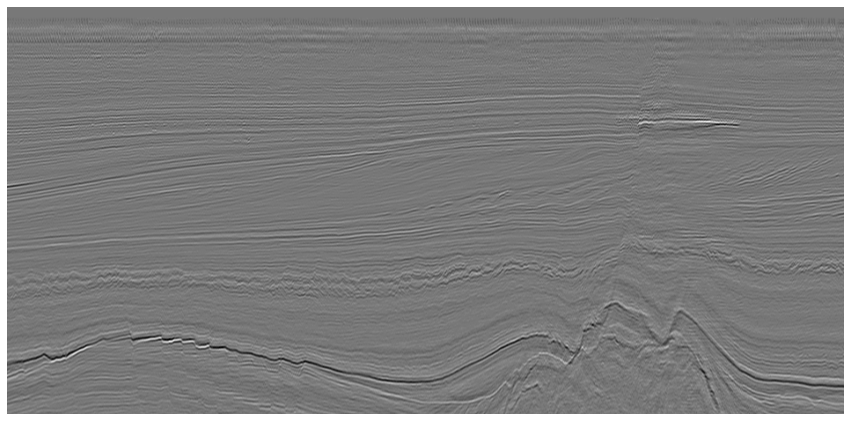

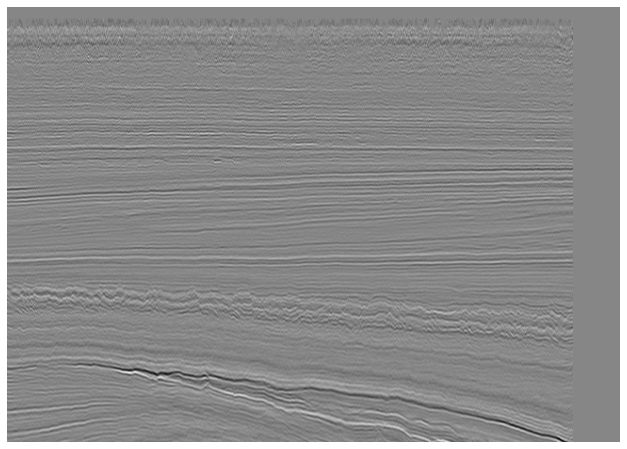

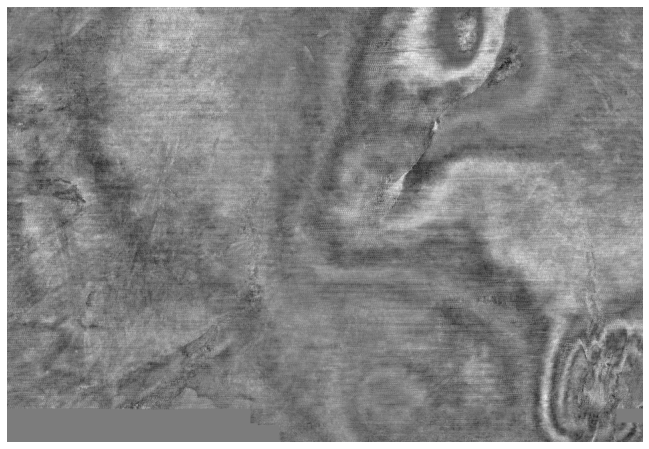

In [2]:

#plot_random_directions(data, 100)
fig = plt.figure(figsize=(15, 8))
ax = plt.subplot()
ax.imshow(data["inline"][100].T, cmap="gray")
plt.axis('off')
plt.yticks(visible=False)
plt.xticks(visible=False)

filename = output_folder + "/_inline_plain" 
plt.savefig(filename, bbox_inches='tight')




fig = plt.figure(figsize=(15, 8))
ax = plt.subplot()
ax.imshow(data["xline"][100].T, cmap="gray")
plt.axis('off')
plt.yticks(visible=False)
plt.xticks(visible=False)

filename = output_folder + "/_xline_plain" 
plt.savefig(filename, bbox_inches='tight')


           
           
fig = plt.figure(figsize=(15, 8))
ax = plt.subplot()
ax.imshow(data["tline"][100].T, cmap="gray")
plt.axis('off')
plt.yticks(visible=False)
plt.xticks(visible=False)

filename = output_folder + "/_tline_plain" 
plt.savefig(filename, bbox_inches='tight')




In [5]:
"""
We see that inline and xline directions have clear stacking patterns, 
but the tline is more meshy.

Intuitivly, we would could easily see more clear pattern change in iline/xline direction 
"""

'\nWe see that inline and xline directions have clear stacking patterns, \nbut the tline is more meshy.\n\nIntuitivly, we would could easily see more clear pattern change in iline/xline direction \n'

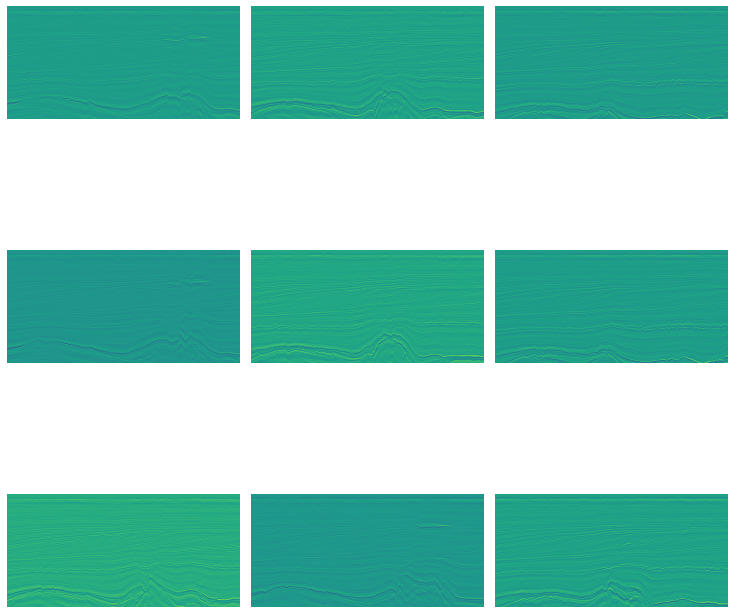

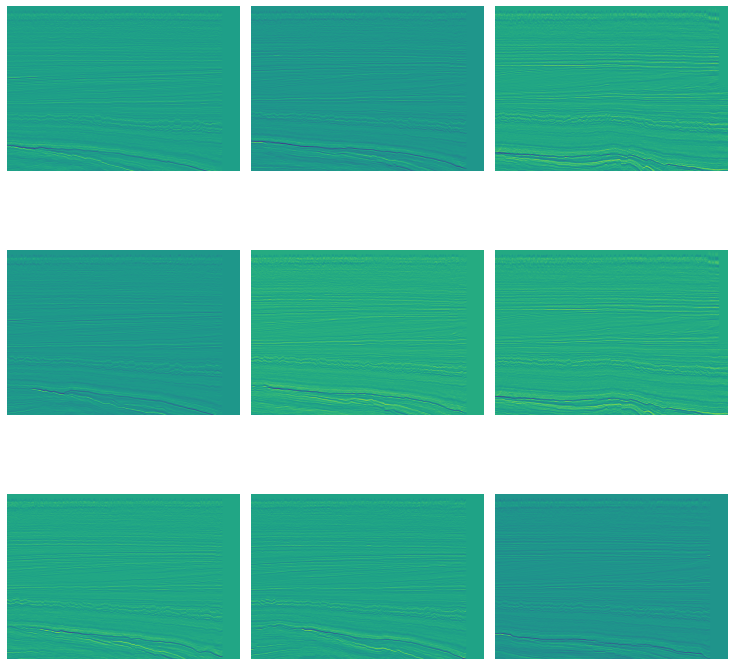

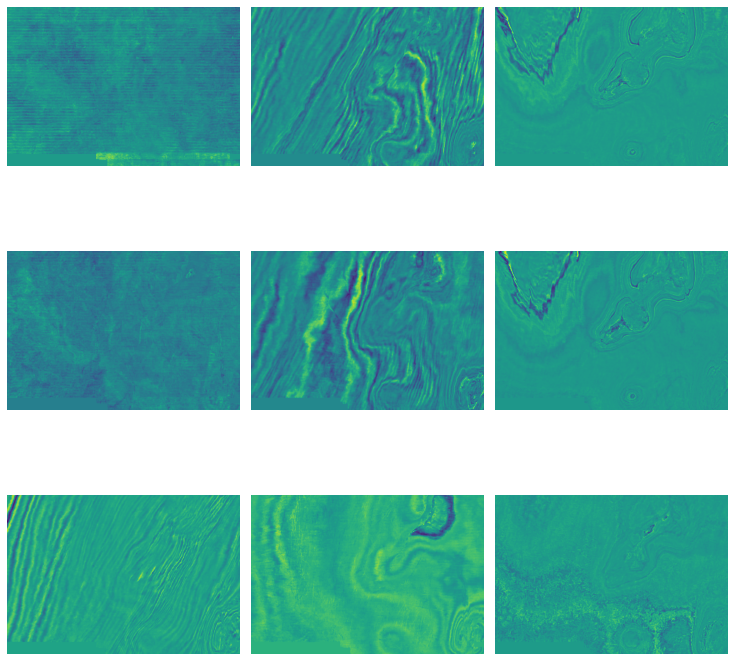

In [3]:
# plot supsets of each direction to visualize patterns in each direction
plot_subset_of_directions(data, directions, 100)

In [4]:
"""
When looking at macroscopic patterns, we see that all do contain such patterns

"""

'\nWhen looking at macroscopic patterns, we see that all do contain such patterns\n\n'

In [5]:
# flatten directions 
data = flatten_directional_data(data, num_samples)
print("flattten dirs", data["inline"].shape, data["xline"].shape, data["tline"].shape )


flattten dirs (651, 439362) (951, 300762) (462, 619101)


In [6]:
from matplotlib import offsetbox
import cv2

def plot_components(proj, images=None, ax=None,
                    thumb_frac=0.05, cmap='gray'):
    """ Plots thumb_frac number of original proj as thumbnails images over a scatterplot for visualization"""
    ax = ax or plt.gca()
    
    #ax.plot(proj[:, 0], proj[:, 1], '.k')
    
    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2
        shown_images = np.array([2 * proj.max(0)])
        for i in range(proj.shape[0]):
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            if np.min(dist) < min_dist_2:
                # don't show points that are too close
                continue
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(images[i].T, cmap=cmap),
                                      proj[i])
            ax.add_artist(imagebox)
    return ax
            
            


In [7]:

from collections import OrderedDict
from functools import partial
from time import time

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter
from sklearn.decomposition import PCA

from sklearn import manifold, datasets
import umap

# set n_points to the p
n_points = 2000
n_neighbors = 20
n_components = 2

methods = OrderedDict()
methods['PCA'] = PCA(n_components=2)
pca = {}

LLE = partial(manifold.LocallyLinearEmbedding, n_neighbors, n_components, eigen_solver='auto')
#methods['LLE'] = LLE(method='standard')
#lle = {}

#methods['LTSA'] = LLE(method='ltsa')

#methods['Hessian LLE'] = LLE(method='hessian')

#methods['Modified LLE'] = LLE(method='modified')

#methods['Isomap'] = manifold.Isomap(n_neighbors, n_components)
#Isomap = {}

#methods['MDS'] = manifold.MDS(n_components, max_iter=100, n_init=1)
#MDS = {}

#methods['SE'] = manifold.SpectralEmbedding(n_components=n_components,
                                           n_neighbors=n_neighbors)
methods['t-SNE'] = manifold.TSNE(n_components=n_components, init='pca', random_state=0)
t_SNE = {}

reducer_umap = umap.UMAP()
methods['UMAP'] = reducer_umap
UMAP = {}

/usr/local/lib/python3.7/site-packages/umap/spectral.py:4: NumbaDeprecationWarning: No direct replacement for 'numba.targets' available. Visit https://gitter.im/numba/numba-dev to request help. Thanks!
  import numba.targets


In [2]:
# Subsample to be bale to compute without waiting for years
sub_sampled = {}
sub_sampled_labels ={}
sub_sampled_labels_per_image = {}
sub_sampled_labels_per_grid_cell = {}


PLotting new grid:



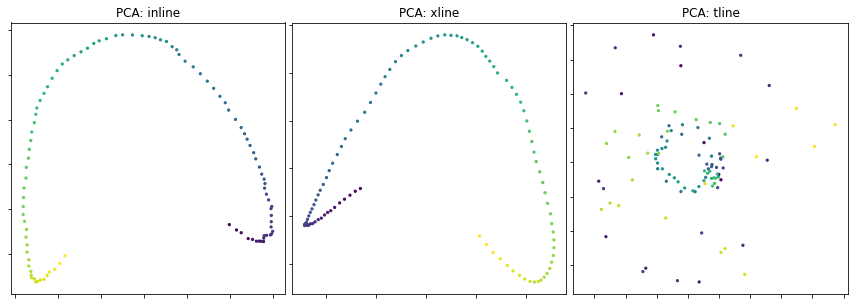

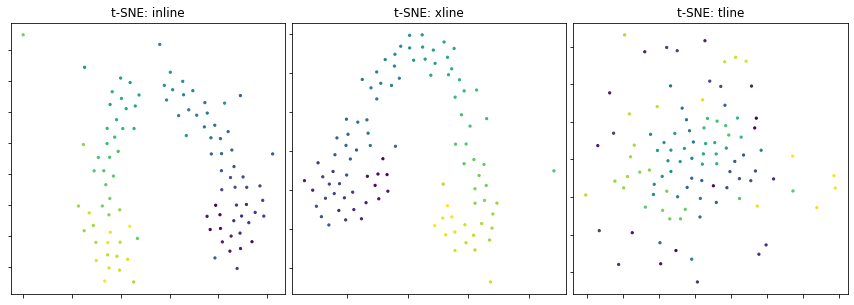

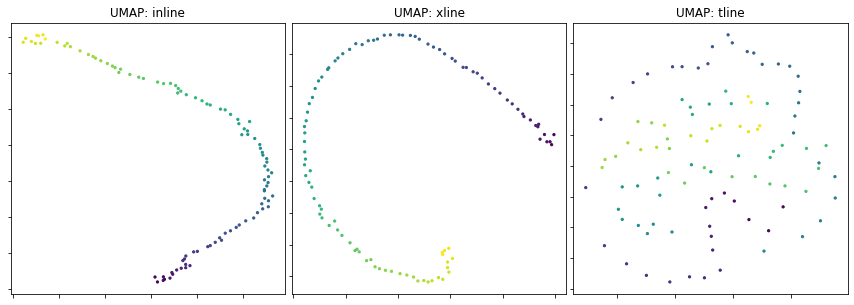

In [11]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from mpl_toolkits.axes_grid1.inset_locator import mark_inset

### plot a manifold learner foreach direciton
import matplotlib.gridspec as gridspec
dir = "inline"
label_colors = [np.arange(100)]
for lb in label_colors:
    print("")
    print("PLotting new grid:")
    print("")
    for (label, method) in methods.items():
        
        i = 0
        plt.figure(figsize = (15,5))
        gs1 = gridspec.GridSpec(1,3)
        gs1.update(wspace=0.025, hspace=0.05) # set the spacing between axes. 
        for dir in directions:
            ax1 = plt.subplot(gs1[i])
            #plt.axis('off')
            #ax1.set_xticklabels([])
            #ax1.set_yticklabels([])
            #ax1.set_aspect('equal')
            ax1.xaxis.set_major_formatter(NullFormatter())
            ax1.yaxis.set_major_formatter(NullFormatter())
            #ax1.axis('tight')
            ax1.set_title("%s: %s" % (label, dir))
            plt.scatter(results[dir][label]["data"][:, 0], results[dir][label]["data"][:, 1], s=5, c=lb[:int(n_points/2)-10],cmap=plt.cm.get_cmap('viridis', 100))#,color="black")
            i+=1
            
            
    
    plt.show()



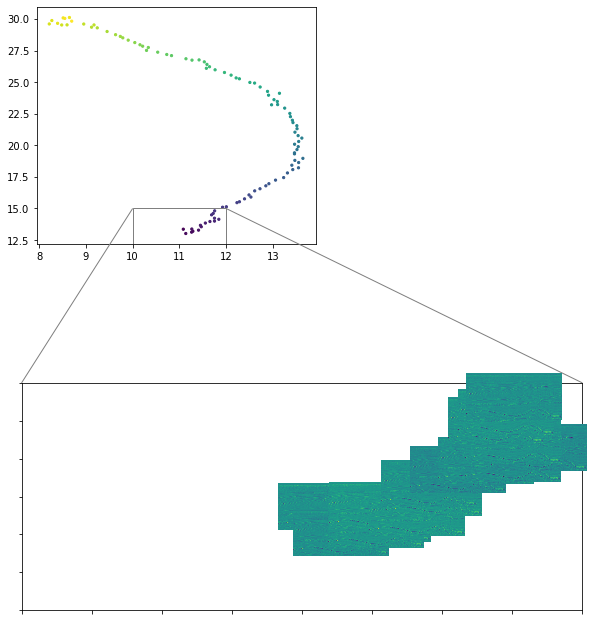

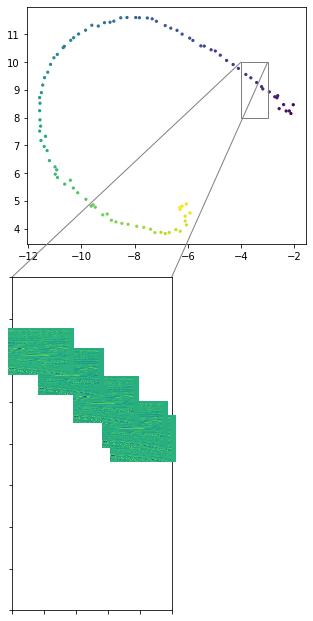

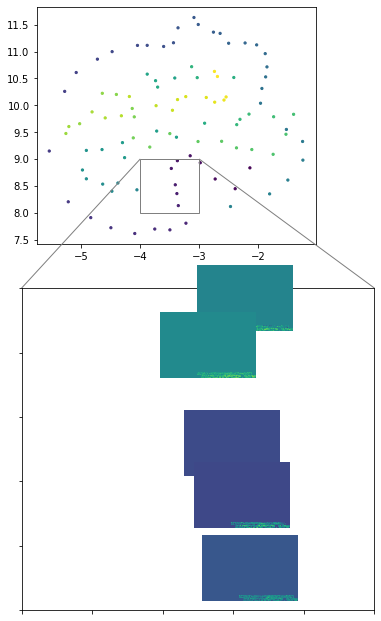

In [20]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from mpl_toolkits.axes_grid1.inset_locator import mark_inset

ps=16
dir ="inline"
label ="UMAP"
lb = label_colors[0]

for dir in directions:

    fig, ax = plt.subplots(1, figsize=(5,10))
    fig.subplots_adjust( bottom=0.55)
    plt.scatter(results[dir][label]["data"][:, 0], results[dir][label]["data"][:, 1], s=5, c=lb[:int(n_points/2)-10],cmap=plt.cm.get_cmap('viridis', 100))#,color="black")

    # # Setup zoom window
    axins = zoomed_inset_axes(ax, 6, loc='lower left', bbox_to_anchor=(0,0), borderpad=3)
    mark_inset(ax, axins, loc1=2, loc2=1, fc="none", ec="0.5")
    # inline

    if dir == "inline":
        axins.set_xlim([10,12])
        axins.set_ylim([12,15])
    #xline
    if dir == "xline":
        axins.set_xlim([-4,-3])
        axins.set_ylim([8,10])
    # tline
    if dir == "tline":
        axins.set_xlim([-4,-3])
        axins.set_ylim([8,9])


    plt.yticks(visible=False)
    plt.xticks(visible=False)
    plt.scatter(results[dir][label]["data"][:, 0], results[dir][label]["data"][:, 1], s=5, c=lb[:int(n_points/2)-10],cmap=plt.cm.get_cmap('viridis', 100))#,color="black")

    if dir == "tline": 
        images = [np.reshape(i, (shape[dir][1], shape[dir][0])).T for i in data[dir]]
    else:
        images = [np.reshape(i, (shape[dir][0], shape[dir][1])).T for i in data[dir]]
    image_zoom=0.1
    artists = []
    for xy, i in zip(results[dir][label]["data"], images):
        x0, y0 = xy
        img = OffsetImage(i, zoom=image_zoom)
        ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
        artists.append(axins.add_artist(ab))
    #axins.update_datalim(data)
    #axins.autoscale()

    filename = output_folder + "/_section_grid_zoom" + label +"_"+ dir + "_"+ str(ps) + "_thumbnail__"
    plt.savefig(filename, bbox_inches='tight')
    plt.show()



Plottting:  inline PCA
Plottting:  inline t-SNE
Plottting:  inline UMAP
Plottting:  xline PCA
Plottting:  xline t-SNE
Plottting:  xline UMAP
Plottting:  tline PCA
Plottting:  tline t-SNE
Plottting:  tline UMAP


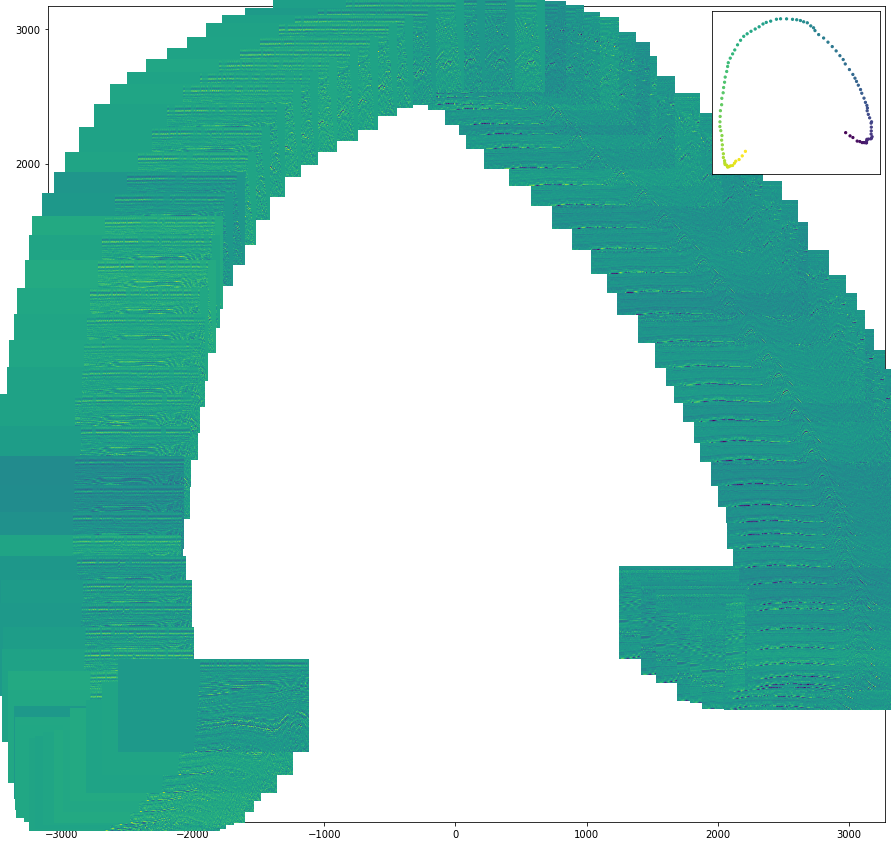

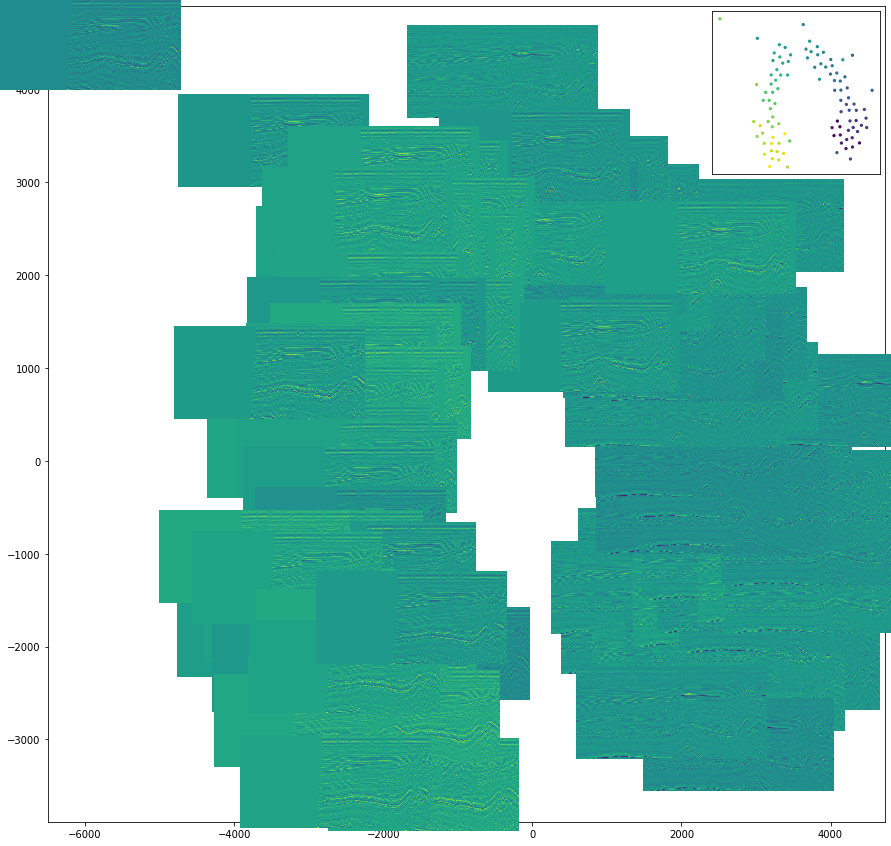

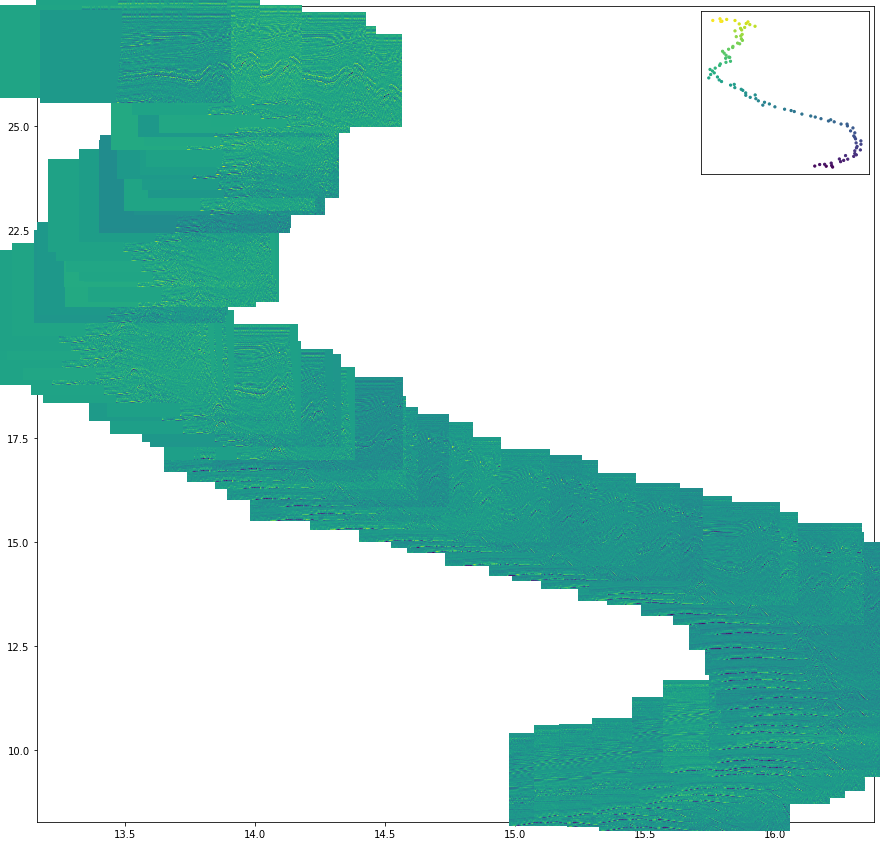

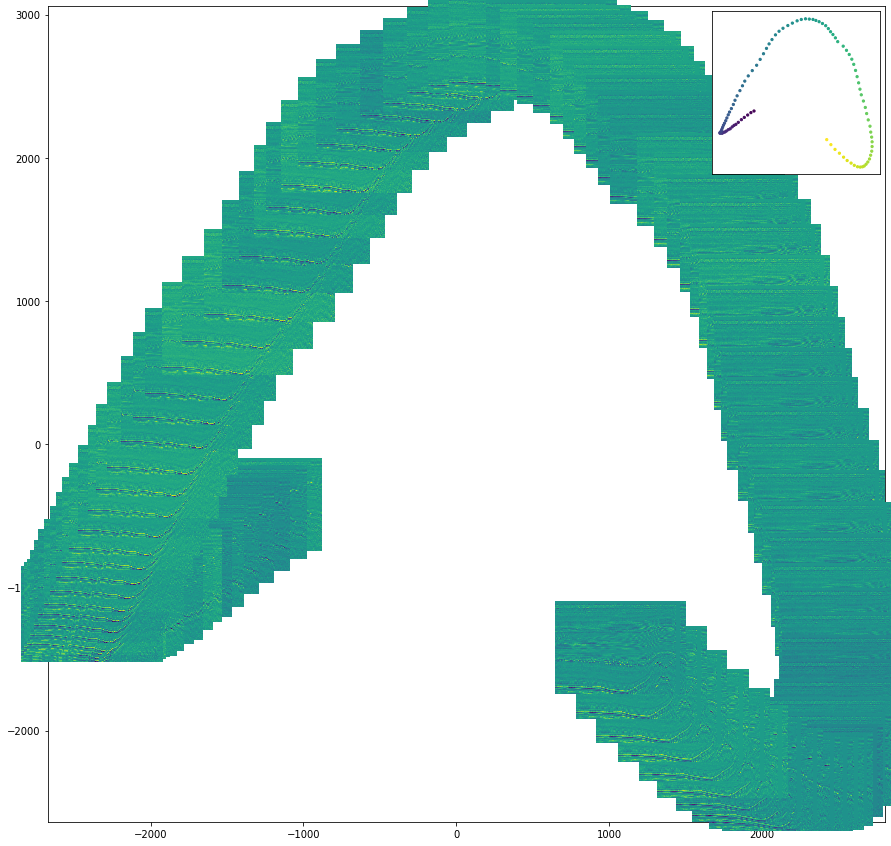

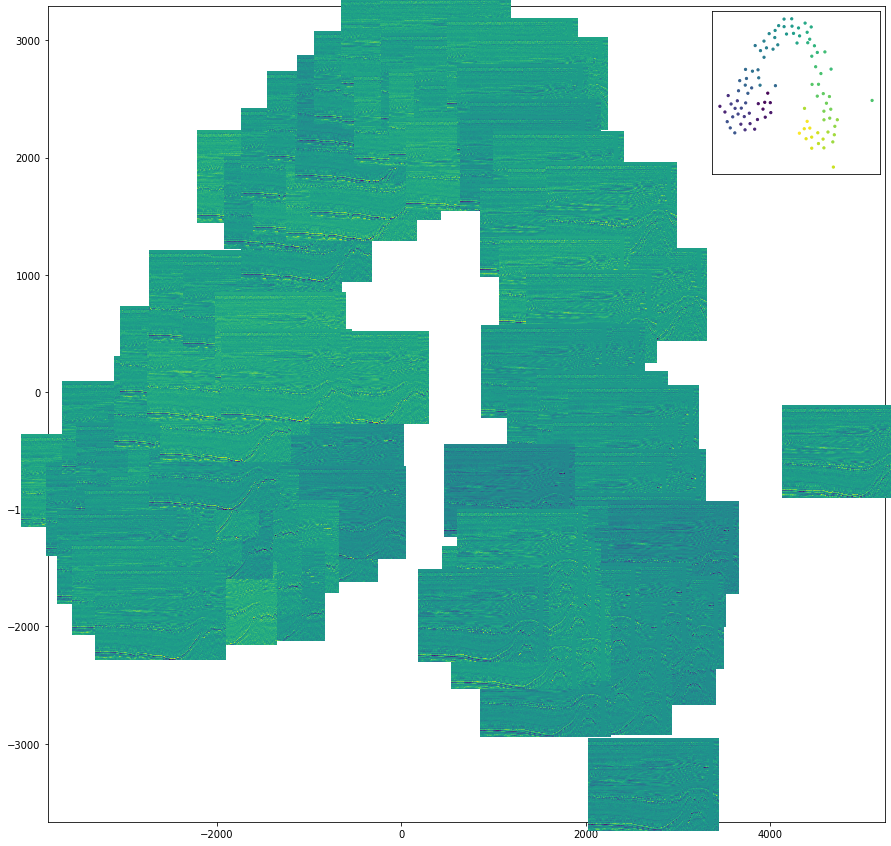

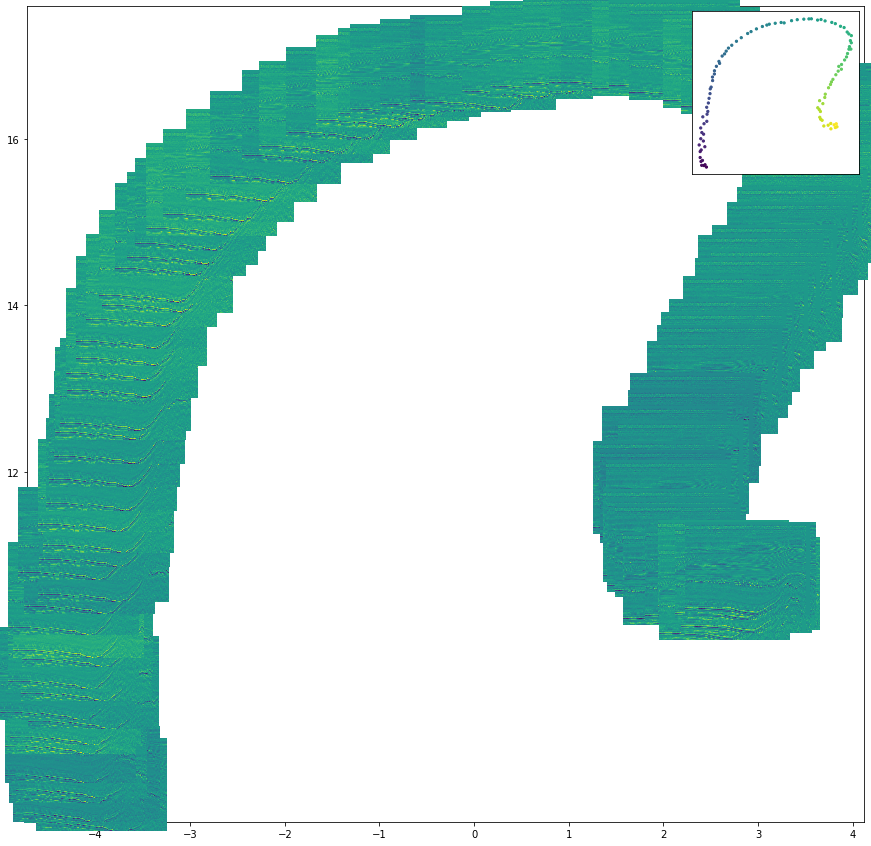

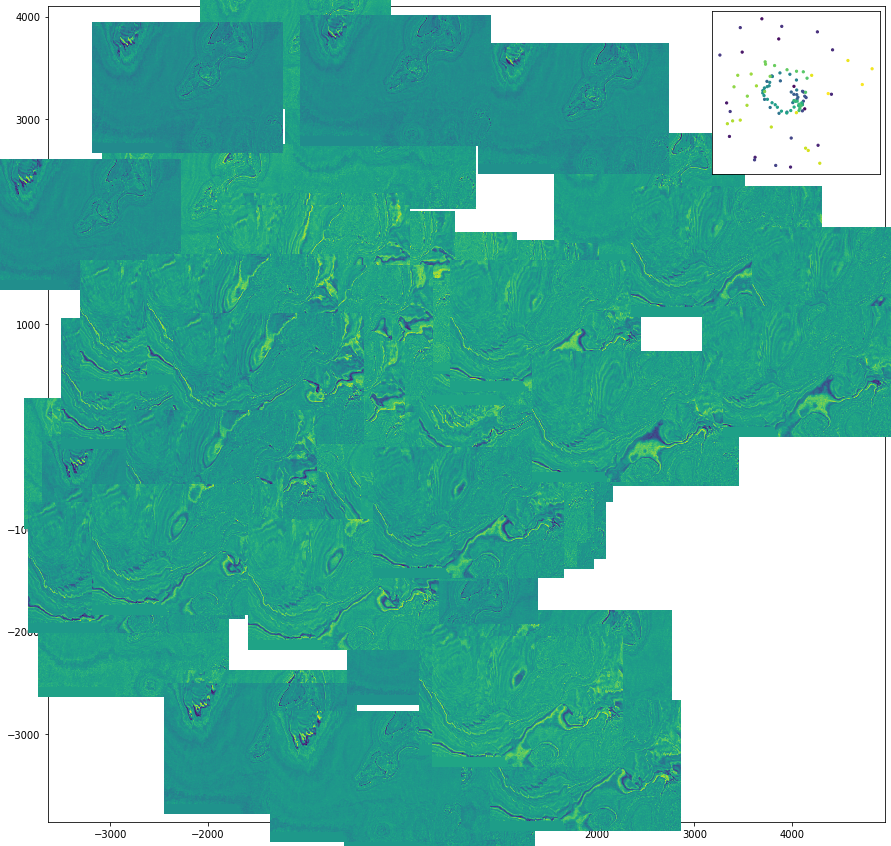

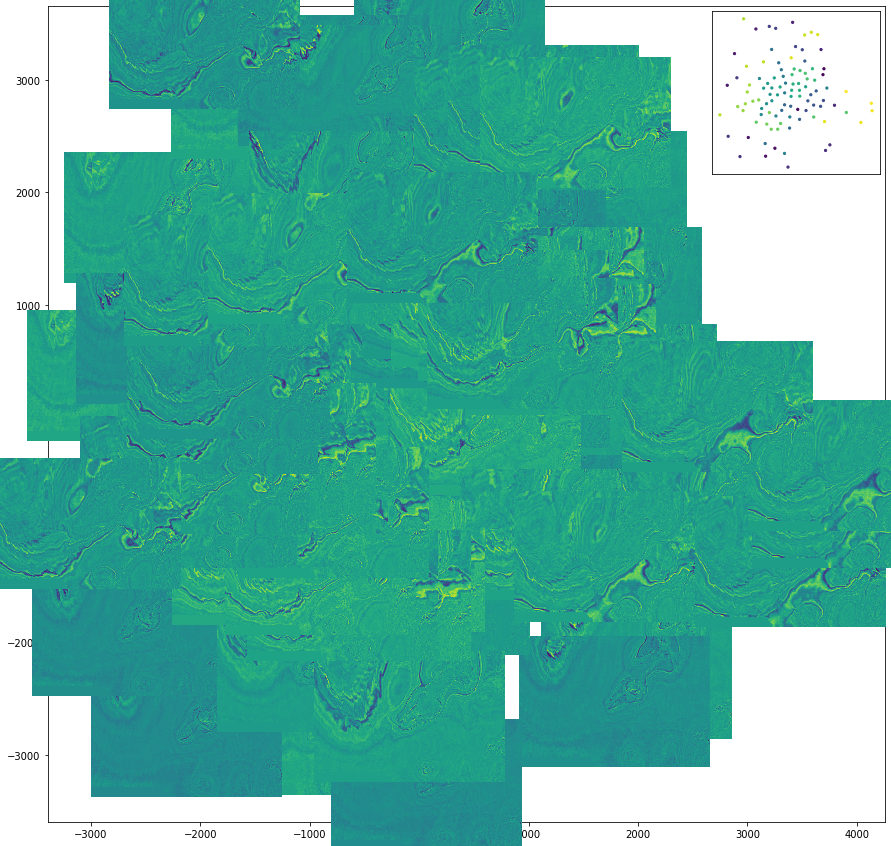

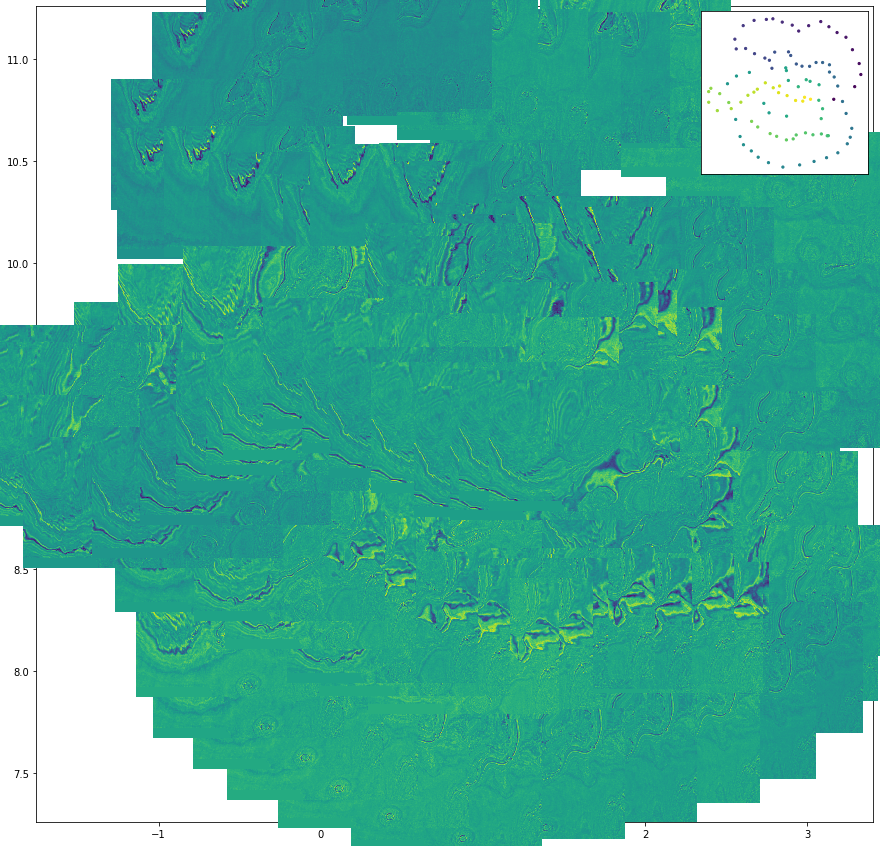

In [48]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
# visualise the scatterplot in actual images 
from mpl_toolkits.axes_grid.inset_locator import inset_axes

directions=["inline", "xline", "tline"]
for dir in directions:
    for (label, method) in methods.items():
        print("Plottting: ", dir,label )
        fig = plt.figure(figsize=(15, 15))
        ax = plt.subplot()
        images = data[dir][-100:]
        plots = results[dir][label]["data"][:100]
        dims = shape[dir]
        filename = output_folder + "/" + label +"_sliceplot_" + dir + "_full"+ ".png"
        if dir == "tline":
            images = [np.reshape(i, (dims[1],dims[0])).T for i in images]
        else: 
            images = [np.reshape(i, (dims[0],dims[1])).T for i in images]
        image_zoom=0.2
        artists = []
        for xy, i in zip(results[dir][label]["data"], images):
            x0, y0 = xy
            img = OffsetImage(i, zoom=image_zoom)
            ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
            artists.append(ax.add_artist(ab))
        ax.update_datalim(results[dir][label]["data"])
        ax.autoscale()
        # this is an inset axes over the main axes
        ins_axes = inset_axes(ax, 
                            width="20%", # width = 30% of parent_bbox
                            height="20%", # height : 1 inch
                            loc=1)
        #plt.title('Probability')
        plt.xticks([])
        plt.yticks([])
        plt.scatter(results[dir][label]["data"][:, 0], results[dir][label]["data"][:, 1], s=5, c=lb[:int(n_points/2)-10],cmap=plt.cm.get_cmap('viridis', 100))#,color="black")
        filename = output_folder + "/_section_sliceplot_" + label +"_"+ dir + "_thumbnail__"
        plt.savefig(filename, bbox_inches='tight')
            
            
            